<a href="https://colab.research.google.com/github/aishaabduallah/week4/blob/main/CNN_Exercise_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Convolutional Neural Network (CNN) using Keras
This notebook will guide you through the process of creating a CNN model using Keras. Follow the steps and fill in the code blocks as you progress.

# Dataset Card: Men vs. Women Classification

## Overview
The Men vs. Women Classification dataset contains images of men and women intended for binary image classification tasks. The goal is to classify images based on gender.

- **Dataset URL:** [Men vs. Women Classification Dataset](https://www.kaggle.com/datasets/saadpd/menwomen-classification)
- **Dataset Size:** ~845 MB
- **Classes:** 2 (Men, Women)
- **Image Format:** JPEG

## Structure

### Folders
The dataset is organized into two main folders:

- `traindata/`:
  - `traindata/`: Contains the training images.
    - `men/`: Contains images of men.
    - `women/`: Contains images of women.

- `testdata/`:
  - `testdata/`: Contains the testing images.
    - `men/`: Contains images of men.
    - `women/`: Contains images of women.

### Example Files
Here are some example file names you might find in the dataset:

- `traindata/traindata/men/000000899.jpg`
- `traindata/traindata/women/00000001.jpg`
- `testdata/testdata/men/00000504.jpg`
- `testdata/testdata/women/00000002.jpg`

### Image Specifications
- **Resolution:** Varies
- **Color:** RGB

## Usage
This dataset is ideal for practicing binary image classification using Convolutional Neural Networks (CNNs). It can be used to train a model to distinguish between images of men and women.

In [1]:
import tensorflow as tf
import keras
from keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Dropout
from keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
import cv2
import numpy as np
from sklearn.model_selection import train_test_split


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
train_dir = '/content/drive/MyDrive/Exer/traindata'
test_dir = '/content/drive/MyDrive/Exer/testdata'

img_size = (600, 600)
batch_size = 128

train_datagen = ImageDataGenerator(
    featurewise_center=True,
    featurewise_std_normalization=True,
    rotation_range=20,
    zoom_range=0.2,
    horizontal_flip=True,
    rescale=1.0/255.0)


test_datagen = ImageDataGenerator(
    featurewise_center=True,
    featurewise_std_normalization=True,
    rotation_range=20,
    zoom_range=0.2,
    horizontal_flip=True,
    rescale=1.0/255.0)


train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='binary'
)


test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='binary'
)


X_train, y_train = next(train_generator)
X_test, y_test = next(test_generator)


Found 967 images belonging to 1 classes.
Found 40 images belonging to 1 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/preprocessing/image.py:1862: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/preprocessing/image.py:1872: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


In [4]:
img = cv2.imread('/content/drive/MyDrive/Exer/testdata/testdata/women/00000028.jpeg')

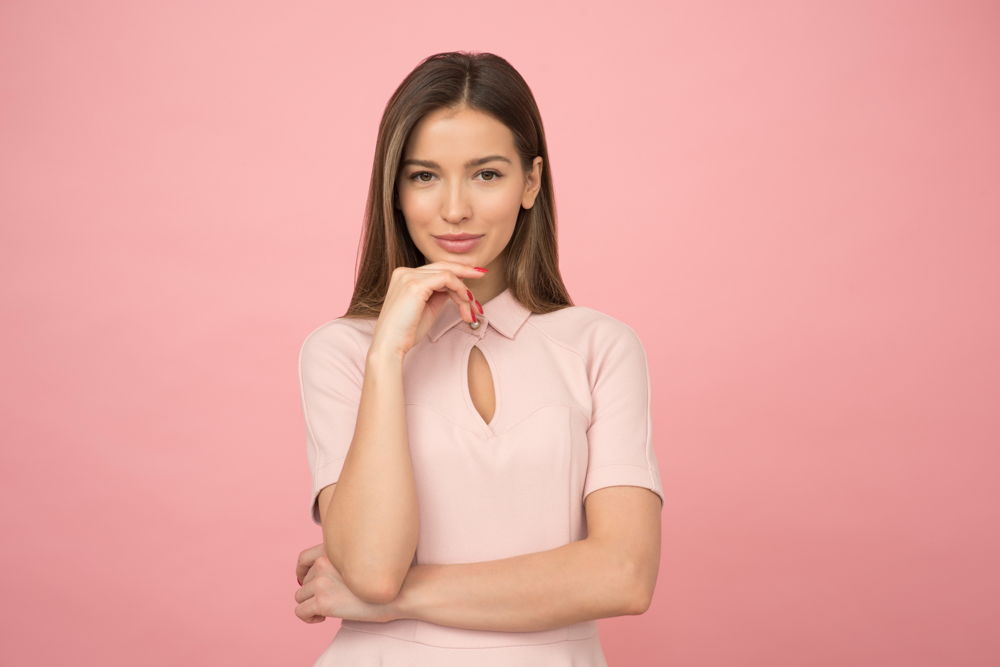

In [5]:
# Display the image
from google.colab.patches import cv2_imshow
cv2_imshow(img)

## CNN Model


In [6]:
model = Sequential()

model.add(Conv2D(16,(3,3), input_shape=(600,600,3), activation='relu'))
model.add(Conv2D(16,(3,3), activation='relu'))
model.add(Conv2D(16,(3,3), activation='relu'))

model.add(MaxPooling2D(2,2))

model.add(Conv2D(16,(3,3), activation='relu'))
model.add(Conv2D(16,(3,3), activation='relu'))

model.add(MaxPooling2D(2,2))

model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 598, 598, 16)      448       
                                                                 
 conv2d_1 (Conv2D)           (None, 596, 596, 16)      2320      
                                                                 
 conv2d_2 (Conv2D)           (None, 594, 594, 16)      2320      
                                                                 
 max_pooling2d (MaxPooling2  (None, 297, 297, 16)      0         
 D)                                                              
                                                                 
 conv2d_3 (Conv2D)           (None, 295, 295, 16)      2320      
                                                                 
 conv2d_4 (Conv2D)           (None, 293, 293, 16)      2320      
                                                        

In [7]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'] )

In [8]:
model.fit(train_generator, epochs=10, validation_data=test_generator)

Epoch 1/10
8/8 [==============================] - 198s 23s/step - loss: 0.0898 - accuracy: 0.9959 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 184s 22s/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 184s 22s/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 184s 22s/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 183s 22s/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 184s 22s/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 183s 22s/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.

##  Evaluate the Model


In [9]:
loss, accuracy = model.evaluate(test_generator)
print(f'Test accuracy: {accuracy:.2f}')

/usr/local/lib/python3.10/dist-packages/keras/src/preprocessing/image.py:1862: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/preprocessing/image.py:1872: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


1/1 [==============================] - 8s 8s/step - loss: 0.0000e+00 - accuracy: 1.0000
Test accuracy: 1.00
